# Checkplot features in detail

This notebook describes how to use the astrobase modules [checkplot](https://github.com/waqasbhatti/astrobase/blob/master/astrobase/checkplot.py) and [lcproc](https://github.com/waqasbhatti/astrobase/blob/master/astrobase/lcproc.py) to post-process a collection of light curves. We'll go through all the various features one can add to checkplots to make it easier to visualize and classify objects in a light curve collection, especially when the [checkplotserver](https://github.com/waqasbhatti/astrobase/blob/master/astrobase/cpserver/checkplotserver.py) webapp is used.

We'll be using a bunch of text light curves I've collected from the [HATPI](https://hatpi.org) prototype's observations of the Galactic Center in 2015, and more specifically of the open cluster [IC4725](simbad.u-strasbg.fr/simbad/sim-id?Ident=M+25). I'll go through the following topics:

- [how to make lcproc.py understand a new light curve format](#Using-custom-format-light-curves-with-lcproc)
- [collecting object and neighbor information into a catalog](#Collecting-LC-object-and-neighbor-information)
- [adding external cross-match information](#Collecting-cross-match-information)
- [running period-finding on a light curve collection](#Period-finding-for-a-light-curve-collection)
- [making checkplots for a light curve collection](#Making-checkplots-for-a-collection-of-light-curves)
- [adding color-magnitude diagrams to checkplot pickles](#Adding-color-mag-diagram-information-to-checkplots)
- [running checkplotlist](#Preparing-a-checkplot-list-for-review)
- [running checkplotserver and a UI overview](#Running-checkplotserver)

## Using custom format light curves with lcproc

In [2]:
# let's look at our light curves
!ls 

IC4725-catalog.pkl		       notebook.tex
IC4725-hatpi-observations-catalog.txt  output_53_0.png
checkplots			       output_55_0.png
csvlcs				       period-finding
lc-collection-work.ipynb	       pklcs
lsp-plot.png			       xmatch-cats
magseries-phased-plot.png


In [3]:
# to make lists of light curve files
import glob

In [4]:
# we'll use the CSV light curves here
lclist = glob.glob('csvlcs/*.csv')

In [5]:
lclist[:10]

['csvlcs/HAT-529-0001333-hplc.csv',
 'csvlcs/HAT-529-0002995-hplc.csv',
 'csvlcs/HAT-529-0003275-hplc.csv',
 'csvlcs/HAT-529-0003381-hplc.csv',
 'csvlcs/HAT-529-0004688-hplc.csv',
 'csvlcs/HAT-529-0004752-hplc.csv',
 'csvlcs/HAT-529-0005160-hplc.csv',
 'csvlcs/HAT-529-0006870-hplc.csv',
 'csvlcs/HAT-529-0007026-hplc.csv',
 'csvlcs/HAT-529-0009125-hplc.csv']

In [6]:
!head csvlcs/HAT-529-0004752-hplc.csv

         rjd             frk          xcc          ycc          irm          ire  irq          iep          itf
 57170.64095     1-419607a_8      707.401     1606.373     -0.01519      0.01102    G     -0.01483     -0.00417
 57170.64139     1-419607b_8      707.407     1606.332      0.00788      0.01118    G      0.00852      0.01224
 57170.64194     1-419607c_8      707.304     1606.379     -0.01655      0.01106    G     -0.00913      0.00846
 57170.64246     1-419607d_8      707.387     1606.375      0.00946      0.01125    G      0.01078      0.02185
 57170.64298     1-419607e_8      707.353     1606.401      0.00038      0.01101    G      0.00412      0.01697
 57170.64347     1-419607f_8      707.336     1606.446     -0.03331      0.01119    G     -0.02867     -0.00639
 57170.64511     1-419608a_8      700.444     1606.361     -0.00102      0.01196    G     -0.00372      0.00029
 57170.64557     1-419608b_8      700.431     1606.381      0.00768      0.01198    G      0.00382      

In [2]:
# This looks like a straightforward text format light curve.
# the columns are: 
# rjd - reduced Julian date (JD - 2400000.0)
# frk - a frame key to uniquely identify each observation
# xcc - x coordinate of the object on the CCD
# ycc - y coordinate of the obejct on the CCD
# irm - the magnitude of the object (this appears to be normalized to zero here)
# ire - the associated error in the magnitude
# irq - some sort of measurement flag ('G' appears to mean all good)
# iep - the EPD magnitude
# itf - the TFA magnitude

# Let's write a function to read the light curve into a Python dict,
# which should be readable by all lcproc and checkplot functions

# we'll use numpy.genfromtxt to read these light curves
import numpy as np

In [1]:
# Let's first look at how to get custom LC formats into lcproc
from astrobase import lcproc

# we use the lcproc.register_custom_lcformat function for this
help(lcproc.register_lcformat)

Help on function register_lcformat in module astrobase.lcproc:

register_lcformat(formatkey, fileglob, timecols, magcols, errcols, readerfunc_module, readerfunc, readerfunc_kwargs=None, normfunc_module=None, normfunc=None, normfunc_kwargs=None, magsarefluxes=False, overwrite_existing=False, lcformat_dir='~/.astrobase/lcformat-jsons')
    This adds a new LC format to the astrobase LC format registry.
    
    Allows handling of custom format light curves for astrobase lcproc
    drivers. Once the format is successfully registered, light curves should
    work transparently with all of the functions in this module, by simply
    calling them with the `formatkey` in the `lcformat` keyword argument.
    
    LC format specifications are generated as JSON files. astrobase comes with
    several of these in `<astrobase install path>/data/lcformats`. LC formats
    you add by using this function will have their specifiers written to the
    `~/.astrobase/lcformat-jsons` directory in your home

In [3]:
# So it looks like we need something like the following to provide
# to the register_custom_lcformat function

# we'll call these 'hplc' format light curves
formatkey = 'hplc'

# the file glob used to recognized these light curves in a directory listing
fileglob = 'HAT-*-hplc.csv'

# the module to get the readerfunc from - we'll generate this here
# readerfunc_module = 'lcreadermodule.py'

# this is the readerfunc we'll make below, let's skip this one for now
# readerfunc = read_csv_lightcurve

# the list of time columns in the light curve dict we want to process
# this is just 'rjd' for this LC format
timecols = ['rjd']

# the list of magnitude/flux columns in the light curve we want to process
# let's use the EPD magnitudes only
magcols = ['iep']

# the list of err columns associated with each mag column
# this is 'ire' for this LC format
errcols = ['ire']

# we're using magnitudes so set this to False
magsarefluxes = False

# we're not going to normalize our light curve in some special way
# so set this to None
normfunc_module, normfunc, normfunc_kwargs = None, None, None

In [4]:
# Now, let's make the function to read in a light curve.
# This will return a dict as expected by lcproc functions.
# The dict will be barebones at first, but we'll use the catalog
# file to add in extra information for each object, such as RA, Dec, 
# and magnitudes in various bandpasses. This information can then be
# transparently used by checkplot functions.

import os.path

# First, the LC reader function
def read_csv_lightcurve(lcfile):
    '''This reads the light curve lcfile.
    
    '''
    
    # read the LC into a numpy recarray
    recarr = np.genfromtxt(lcfile, 
                           usecols=(0,1,2,3,4,5,6,7,8),
                           names=['rjd','frk','xcc','ycc','irm','ire','irq','iep','itf'],
                           dtype='f8,U20,f8,f8,f8,f8,S20,f8,f8',
                           skip_header=1)
    
    # generate the objectid
    # here, we're basically stripping the filename to form the objectid
    objectid = os.path.splitext(os.path.basename(lcfile))[0].rstrip('-hplc')
    
    # generate a barebones objectinfo
    objectinfo = {'objectid': objectid}
    
    # this is the lcdict we need
    lcdict = {'objectid': objectid,
              'objectinfo':objectinfo,
              'rjd':recarr['rjd'],
              'iep':recarr['iep'],
              'ire':recarr['ire']}
    
    return lcdict


In [5]:
# Let's test this function out
lcdict = read_csv_lightcurve('csvlcs/HAT-529-0004752-hplc.csv')

In [6]:
# Looks good
lcdict

{'iep': array([-0.01483,  0.00852, -0.00913, ...,  0.01659, -0.05152, -0.02914]),
 'ire': array([ 0.01102,  0.01118,  0.01106, ...,  0.01081,  0.01076,  0.01018]),
 'objectid': 'HAT-529-0004752',
 'objectinfo': {'objectid': 'HAT-529-0004752'},
 'rjd': array([ 57170.64095,  57170.64139,  57170.64194, ...,  57274.63173,
         57274.63222,  57274.63355])}

In [ ]:
# Let's write the LC reader function to a module so we can import it
%%writefile ./lcreadermodule.py
#!/usr/bin/env python

import os.path

# First, the LC reader function
def read_csv_lightcurve(lcfile):
    '''This reads the light curve lcfile.
    
    '''
    
    # read the LC into a numpy recarray
    recarr = np.genfromtxt(lcfile, 
                           usecols=(0,1,2,3,4,5,6,7,8),
                           names=['rjd','frk','xcc','ycc','irm','ire','irq','iep','itf'],
                           dtype='f8,U20,f8,f8,f8,f8,S20,f8,f8',
                           skip_header=1)
    
    # generate the objectid
    # here, we're basically stripping the filename to form the objectid
    objectid = os.path.splitext(os.path.basename(lcfile))[0].rstrip('-hplc')
    
    # generate a barebones objectinfo
    objectinfo = {'objectid': objectid}
    
    # this is the lcdict we need
    lcdict = {'objectid': objectid,
              'objectinfo':objectinfo,
              'rjd':recarr['rjd'],
              'iep':recarr['iep'],
              'ire':recarr['ire']}
    
    return lcdict

In [7]:
# Let's register this LC format now
lcproc.register_lcformat(formatkey, fileglob, 
                         timecols, magcols, errcols, 
                         './lcreadermodule.py', 'read_csv_lightcurve', 
                         magsarefluxes=magsarefluxes)

[2018-03-20T00:31:19Z - INFO] added hplc to registry


In [8]:
# Let's make sure it registered fine
lcproc.get_lcformat('hplc')

['HAT-*-hplc.csv',
 <function __main__.read_csv_lightcurve>,
 ['rjd'],
 ['iep'],
 ['ire'],
 False,
 None]

In [9]:
# Many checkplot and lcproc functions require at least an 
# objectid, RA, Dec, and some some sort of magnitude.
# We have a catalog file in this directory, which we can
# use to add this info to the light curve
!ls *.txt

IC4725-hatpi-observations-catalog.txt


In [10]:
!head IC4725-hatpi-observations-catalog.txt

      ndet|               hatid|   network|  stations|            objectid|          ra|        decl|        jmag|    jmag_err|        hmag|    hmag_err|        kmag|    kmag_err|        bmag|        vmag|        rmag|        imag|       sdssu|       sdssg|       sdssr|       sdssi|       sdssz
     15507|     HAT-529-0001333|        HP|   ['HP1']|     HAT-529-0001333|   278.06984|   -18.74239|     7.26500|     0.03000|     6.40500|     0.02400|     6.10700|     0.02300|    12.41700|    10.66700|     9.67500|     8.69300|    14.15000|    11.31000|     9.83400|     9.27200|     8.81600
     15487|     HAT-529-0002995|        HP|   ['HP1']|     HAT-529-0002995|   277.41904|   -18.67429|     8.30000|     0.02100|     7.67200|     0.03400|     7.48700|     0.02300|    11.98200|    10.69900|     9.99900|     9.30800|    13.71700|    11.32600|    10.25000|     9.88100|     9.58000
     15510|     HAT-529-0003275|        HP|   ['HP1']|     HAT-529-0003275|   278.31415|   -18.68220|     9.1330

In [11]:
# Let's look at the catalog entry for the object 
# we just read in the LC for
!grep HAT-529-0004752 IC4725-hatpi-observations-catalog.txt

     15511|     HAT-529-0004752|        HP|   ['HP1']|     HAT-529-0004752|   278.08537|   -18.45812|     8.22800|     0.02400|     7.42300|     0.03400|     7.10100|     0.02300|    13.25100|    11.59700|    10.60700|     9.63200|    14.73700|    12.08300|    10.68900|    10.14400|     9.73200


In [12]:
# Now, we can write a function to read in the catalog
# and convert it into a fast look up table to add each
# light curve object's information into the light curve
# dict we generate using read_csv_lightcurve

def read_object_catalog(catalogfile):
    '''
    This reads the catalog into a recarray.
    
    '''
    
    catarr = np.genfromtxt(catalogfile,
                          names=True,
                          delimiter='|',
                          dtype='i8,U20,U20,U20,U20,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8,f8',
                          autostrip=True)
    return catarr

In [13]:
# See if it works fine
objcat = read_object_catalog('IC4725-hatpi-observations-catalog.txt')

In [14]:
# see if our object's in there
'HAT-529-0004752' in objcat['objectid']

True

In [15]:
# Look up our object
objcat_ind = objcat['objectid'] == 'HAT-529-0004752'
objcat[objcat_ind]

array([ (15511, 'HAT-529-0004752', 'HP', "['HP1']", 'HAT-529-0004752',  278.08537, -18.45812,  8.228,  0.024,  7.423,  0.034,  7.101,  0.023,  13.251,  11.597,  10.607,  9.632,  14.737,  12.083,  10.689,  10.144,  9.732)],
      dtype=[('ndet', '<i8'), ('hatid', '<U20'), ('network', '<U20'), ('stations', '<U20'), ('objectid', '<U20'), ('ra', '<f8'), ('decl', '<f8'), ('jmag', '<f8'), ('jmag_err', '<f8'), ('hmag', '<f8'), ('hmag_err', '<f8'), ('kmag', '<f8'), ('kmag_err', '<f8'), ('bmag', '<f8'), ('vmag', '<f8'), ('rmag', '<f8'), ('imag', '<f8'), ('sdssu', '<f8'), ('sdssg', '<f8'), ('sdssr', '<f8'), ('sdssi', '<f8'), ('sdssz', '<f8')])

In [16]:
%%writefile ./lcreadermodule.py
#!/usr/bin/env python

# Now, we can amend read_csv_lightcurve to require
# this loaded catalog and automatically add extra
# object info to the lcdict it produces
def read_csv_lightcurve(lcfile, 
                        catfile='IC4725-hatpi-observations-catalog.txt',
                        infokeys=['objectid','ra','decl','jmag','hmag','kmag',
                                  'bmag','vmag','rmag','imag',
                                  'sdssu','sdssg','sdssr','sdssi','sdssz']):
    '''This reads the light curve lcfile.
    
    '''
    
    # read the LC into a numpy recarray
    recarr = np.genfromtxt(lcfile, 
                           usecols=(0,1,2,3,4,5,6,7,8),
                           names=['rjd','frk','xcc','ycc','irm','ire','irq','iep','itf'],
                           dtype='f8,U20,f8,f8,f8,f8,S20,f8,f8',
                           skip_header=1)
    
    # generate the objectid
    # here, we're basically stripping the filename to form the objectid
    objectid = os.path.splitext(os.path.basename(lcfile))[0].rstrip('-hplc')
    
    # read in the catalog
    catalog_recarray = read_object_catalog(catfile)
    
    # look up this object in the catalog
    objind = catalog_recarray['objectid'] == objectid
    
    # if we find this object, add its info
    if objind.size > 0:
        
        objectinfo = {x:np.asscalar(catalog_recarray[x][objind]) for x in infokeys}
    
    # otherwise, generate a barebones objectinfo
    else:
    
        objectinfo = {'objectid': objectid}
    
    # this is the lcdict we need
    lcdict = {'objectid': objectid,
              'objectinfo':objectinfo,
              'rjd':recarr['rjd'],
              'iep':recarr['iep'],
              'ire':recarr['ire']}
    
    return lcdict


In [17]:
# test this new reader function
lcdict = read_csv_lightcurve('csvlcs/HAT-529-0004752-hplc.csv')

In [18]:
lcdict

{'iep': array([-0.01483,  0.00852, -0.00913, ...,  0.01659, -0.05152, -0.02914]),
 'ire': array([ 0.01102,  0.01118,  0.01106, ...,  0.01081,  0.01076,  0.01018]),
 'objectid': 'HAT-529-0004752',
 'objectinfo': {'bmag': 13.251,
  'decl': -18.45812,
  'hmag': 7.423,
  'imag': 9.632,
  'jmag': 8.228,
  'kmag': 7.101,
  'objectid': 'HAT-529-0004752',
  'ra': 278.08537,
  'rmag': 10.607,
  'sdssg': 12.083,
  'sdssi': 10.144,
  'sdssr': 10.689,
  'sdssu': 14.737,
  'sdssz': 9.732,
  'vmag': 11.597},
 'rjd': array([ 57170.64095,  57170.64139,  57170.64194, ...,  57274.63173,
         57274.63222,  57274.63355])}

In [19]:
# now we have all of the info we need
lcdict['objectinfo']

{'bmag': 13.251,
 'decl': -18.45812,
 'hmag': 7.423,
 'imag': 9.632,
 'jmag': 8.228,
 'kmag': 7.101,
 'objectid': 'HAT-529-0004752',
 'ra': 278.08537,
 'rmag': 10.607,
 'sdssg': 12.083,
 'sdssi': 10.144,
 'sdssr': 10.689,
 'sdssu': 14.737,
 'sdssz': 9.732,
 'vmag': 11.597}

In [20]:
# let's re-register our readerfunc to make sure it's up to date

# here, we use readerfunc_kwargs to add in the kwargs the readerfunc needs to work properly
# we also set overwrite_existing = True to overwrite the previous LC format definition
lcproc.register_lcformat(formatkey, fileglob, 
                         timecols, magcols, errcols,
                         './lcreadermodule.py', 'read_csv_lightcurve', 
                         readerfunc_kwargs={'catfile':''IC4725-hatpi-observations-catalog.txt',
                                            'infokeys':['objectid','ra','decl','jmag','hmag','kmag',
                                                        'bmag','vmag','rmag','imag',
                                                        'sdssu','sdssg','sdssr','sdssi','sdssz']},
                         magsarefluxes=magsarefluxes, 
                         overwrite_existing=True)

[2018-03-20T00:31:35Z - INFO] added hplc to registry


Next, we'll go through some of the LC collection processing functions available in lcproc, in preparation for running period-finding and checkplot operations on large numbers of light curves. We'll be able to use the read_csv_lightcurve function we wrote above transparently to read in and extract information for the light curves.

## Collecting LC object and neighbor information

In [4]:
# To help with neighbor lookups for our objects,
# we can generate a catalog pickle for our light curve
# collection

# we'll use the light curves in our collection and
# the lcproc.catalogs.make_lclist function to generate a catalog
# pickle that has a kdtree for fast cone searching

# make_lclist can optionally also generate a finder chart
# using a FITS image associated with the object catalog
# if the FITS image has WCS information associated with it

from astrobase.lcproc.catalogs import make_lclist
help(make_lclist)

Help on function make_lclist in module astrobase.lcproc.catalogs:

make_lclist(basedir, outfile, use_list_of_filenames=None, lcformat='hat-sql', lcformatdir=None, fileglob=None, recursive=True, columns=['objectid', 'objectinfo.ra', 'objectinfo.decl', 'objectinfo.ndet'], makecoordindex=('objectinfo.ra', 'objectinfo.decl'), field_fitsfile=None, field_wcsfrom=None, field_scale=<astropy.visualization.interval.ZScaleInterval object at 0x1099622b0>, field_stretch=<astropy.visualization.stretch.LinearStretch object at 0x109a14470>, field_colormap=<matplotlib.colors.LinearSegmentedColormap object at 0x1119af4a8>, field_findersize=None, field_pltopts={'marker': 'o', 'markersize': 10.0, 'markerfacecolor': 'none', 'markeredgewidth': 2.0, 'markeredgecolor': 'red'}, field_grid=False, field_gridcolor='k', field_zoomcontain=True, maxlcs=None, nworkers=8)
    This generates a light curve catalog for all light curves in a directory.
    
    Given a base directory where all the files are, and a light c

In [23]:
# Since the HATPI image will be hopelessly crowded, 
# let's use a Digitized Sky Survey finder chart for this field
# we'll use astrobase.services.skyview to get a FITS from the 
# NASA SkyView service
from astrobase.services import skyview

help(skyview.get_stamp)

Help on function get_stamp in module astrobase.services.skyview:

get_stamp(ra, decl, survey='DSS2 Red', scaling='Linear', sizepix=300, forcefetch=False, cachedir='~/.astrobase/stamp-cache', timeout=10.0, verbose=True)
    This gets a FITS cutout from the NASA GSFC SkyView service.
    
    ra, decl are decimal equatorial coordinates for the cutout center.
    
    survey is the name of the survey to get the stamp for. This is 'DSS2 Red' by
    default.
    
    scaling is the type of pixel value scaling to apply to the cutout. This is
    'Linear' by default.
    
    sizepix is the size of the cutout in pixels.
    
    cachedir points to the astrobase stamp-cache directory.
    
    timeout is the amount of time in seconds to wait for a response from the
    service.



In [24]:
# let's get a DSS image for the center of the cluster
# sizepix is set to 2048, and DSS is about 1 arcsec/pix, so this is about 0.6 deg wide
skyview.get_stamp(277.9,-19.25, sizepix=2048, timeout=30.0)

{'fitsfile': '/Users/waqasbhatti/.astrobase/stamp-cache/04b609c8019b3ccb42f670d8ee0606e3eb77fd6d78f5efee0e39713de6cc138b.fits.gz',
 'params': {'decl': -19.25,
  'ra': 277.9,
  'scaling': 'Linear',
  'sizepix': 2048,
  'survey': 'DSS2 Red'},
 'provenance': 'new download'}

In [25]:
# now generate our full catalog and a nice annotated finder chart along with it
lclist = make_lclist(
    'csvlcs', # directory to look in
    'IC4725-catalog.pkl', # output catalog pickle to make
    lcformat='hplc', # specifying our custom LC format key 
    columns=['objectid','objectinfo.ra','objectinfo.decl',
             'objectinfo.bmag','objectinfo.vmag','objectinfo.rmag',
             'objectinfo.sdssu','objectinfo.sdssg','objectinfo.sdssr',
             'objectinfo.sdssi','objectinfo.sdssz'], # specifying catalog columns to extract
    nworkers=4,  # number of parallel workers to launch
    field_fitsfile='/Users/waqasbhatti/.astrobase/stamp-cache/04b609c8019b3ccb42f670d8ee0606e3eb77fd6d78f5efee0e39713de6cc138b.fits.gz',
    field_findersize=(10,10), # to make the PNG a bit more tractable
)

[2018-03-20T00:53:38Z - INFO] searching for hplc light curves in csvlcs ...
[2018-03-20T00:53:38Z - INFO] found 605 light curves
[2018-03-20T00:53:38Z - INFO] collecting light curve info...
[2018-03-20T00:54:02Z - INFO] kdtree generated for (ra, decl): ['objectinfo.ra', 'objectinfo.decl']
[2018-03-20T00:54:03Z - INFO] generated a finder PNG with an object position overlay for this LC list: IC4725-catalog.png
[2018-03-20T00:54:03Z - INFO] done. LC info -> IC4725-catalog.pkl


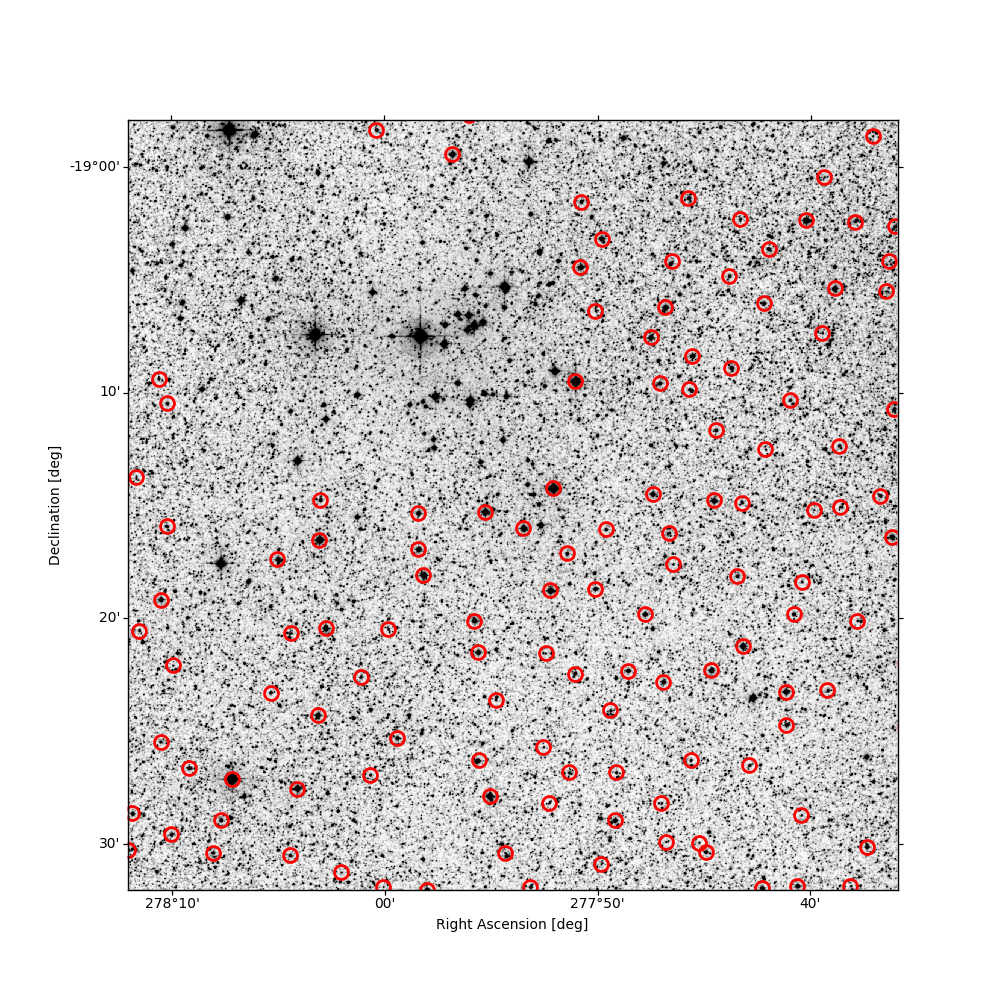

In [26]:
# Let's look at this PNG
from IPython.display import Image

Image('IC4725-catalog.png')

The objects in the catalog pickle are highlighted on the finder chart. We can also look at the catalog pickle directly by reading it in.

In [30]:
import pickle

# we can read the catalog in like any other pickle
with open(lclist,'rb') as infd:
    objcat = pickle.load(infd)

In [31]:
# this is a dict
objcat.keys()

dict_keys(['basedir', 'lcformat', 'fileglob', 'recursive', 'columns', 'makecoordindex', 'nfiles', 'objects', 'kdtree'])

In [32]:
# all the objects are in the 'objects' key
objcat['objects'].keys()

dict_keys(['lcfname', 'ndet_iep', 'objectid', 'ra', 'decl', 'bmag', 'vmag', 'rmag', 'sdssu', 'sdssg', 'sdssr', 'sdssi', 'sdssz'])

In [33]:
# this is our object from before
ind = objcat['objects']['objectid'] == 'HAT-529-0004752'

# here's how to pull out info for an object from the catalog
objcat['objects']['lcfname'][ind], objcat['objects']['ra'][ind], objcat['objects']['decl'][ind],

(array(['csvlcs/HAT-529-0004752-hplc.csv'],
       dtype='<U31'), array([ 278.08537]), array([-18.45812]))

In [5]:
# The object catalog pickle will be used for collecting neighbor information for 
# objects when we make checkplots for them, and can then be used to determine 
# if any observed variability also appears in the neighbors and 
# if the object is instead a blend

# What we can also do with this catalog pickle is filter it according to various
# criteria. This can be done with the lcproc.filter_lclist function.

# This function can also take a FITS image, with identical arguments to make_lclist.
# This can be used to quickly visualize the effects of filtering the object catalog
# based on the various criteria used as arguments for filter_lclist.

from astrobase.lcproc.catalogs import filter_lclist
help(filter_lclist)

Help on function filter_lclist in module astrobase.lcproc.catalogs:

filter_lclist(lc_catalog, objectidcol='objectid', racol='ra', declcol='decl', xmatchexternal=None, xmatchdistarcsec=3.0, externalcolnums=(0, 1, 2), externalcolnames=['objectid', 'ra', 'decl'], externalcoldtypes='U20,f8,f8', externalcolsep=None, externalcommentchar='#', conesearch=None, conesearchworkers=1, columnfilters=None, field_fitsfile=None, field_wcsfrom=None, field_scale=<astropy.visualization.interval.ZScaleInterval object at 0x1121505f8>, field_stretch=<astropy.visualization.stretch.LinearStretch object at 0x1172da160>, field_colormap=<matplotlib.colors.LinearSegmentedColormap object at 0x1119af4a8>, field_findersize=None, field_pltopts={'marker': 'o', 'markersize': 10.0, 'markerfacecolor': 'none', 'markeredgewidth': 2.0, 'markeredgecolor': 'red'}, field_grid=False, field_gridcolor='k', field_zoomcontain=True, copylcsto=None)
    This is used to perform cone-search, cross-match, and column-filter
    operatio

In [29]:
# For example, if we want only the light curves for objects that are:
# - within 10 arcminutes of the cluster center at (277.9, -19.25), and
# - brighter than SDSS r < 12.0
# We'll also pass in our existing FITS image to see if the filtering works as expected
filtered_lcs, filtered_objectids = filter_lclist(
    lclist, # the object catalog pickle we created with make_lclist
    conesearch=[277.9, -19.25, 10.0/60.0], # this is a cone-search filter specification
    columnfilters=['sdssr|lt|12.0'], # this is a list of filters on LC objectinfo conditions
    field_fitsfile='/Users/waqasbhatti/.astrobase/stamp-cache/04b609c8019b3ccb42f670d8ee0606e3eb77fd6d78f5efee0e39713de6cc138b.fits.gz',
    field_findersize=(10,10), # to make the PNG a bit more tractable    
)

[2018-03-20T01:00:11Z - INFO] cone search: objects within 0.1667 deg of (277.900, -19.250): 31
[2018-03-20T01:00:11Z - INFO] filter: sdssr|lt|12.0 -> objects matching: 239 
[2018-03-20T01:00:12Z - INFO] generated a finder PNG with an object position overlay for this filtered LC list: IC4725-catalog-conesearch_RA277.900_DEC-19.250_RAD0.16667_filter_sdssr_lt_12.0.png
[2018-03-20T01:00:12Z - INFO] done. objects matching all filters: 20


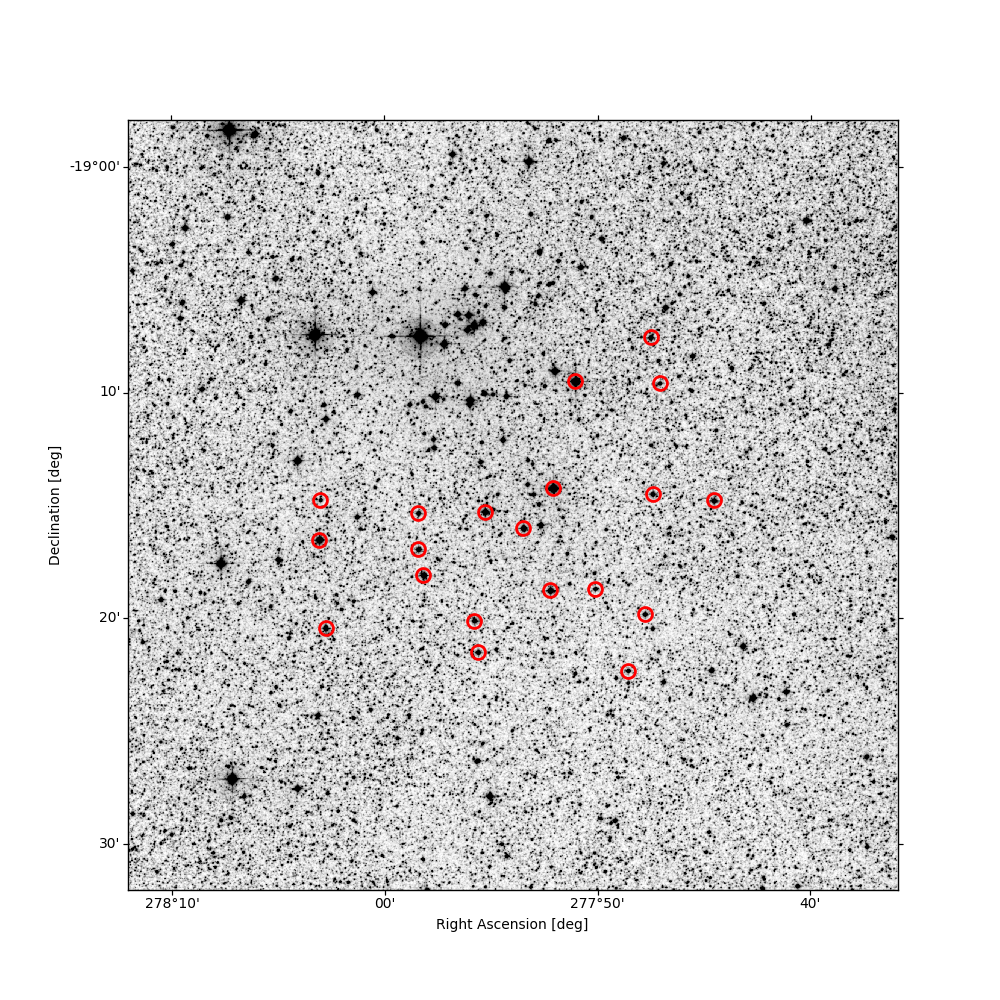

In [30]:
# Let's look at the finder to see if this did what was expected
Image('IC4725-catalog-conesearch_RA277.900_DEC-19.250_RAD0.16667_filter_sdssr_lt_12.0.png')

In [36]:
# Looks about as expected. 

# We can now easily operate on this subset of the LC collection directly, turning it into a list
# these lists can be passed directly to various lcproc functions like parallel_pf_lclist, etc.
filtered_lcs.tolist()

['csvlcs/HAT-577-0000044-hplc.csv',
 'csvlcs/HAT-577-0000221-hplc.csv',
 'csvlcs/HAT-577-0000705-hplc.csv',
 'csvlcs/HAT-577-0001779-hplc.csv',
 'csvlcs/HAT-577-0001797-hplc.csv',
 'csvlcs/HAT-577-0001928-hplc.csv',
 'csvlcs/HAT-577-0002340-hplc.csv',
 'csvlcs/HAT-577-0002857-hplc.csv',
 'csvlcs/HAT-577-0003467-hplc.csv',
 'csvlcs/HAT-577-0004295-hplc.csv',
 'csvlcs/HAT-577-0005172-hplc.csv',
 'csvlcs/HAT-577-0005901-hplc.csv',
 'csvlcs/HAT-577-0007232-hplc.csv',
 'csvlcs/HAT-577-0007519-hplc.csv',
 'csvlcs/HAT-577-0007645-hplc.csv',
 'csvlcs/HAT-577-0008322-hplc.csv',
 'csvlcs/HAT-577-0018039-hplc.csv',
 'csvlcs/HAT-577-0019056-hplc.csv',
 'csvlcs/HAT-577-0035505-hplc.csv',
 'csvlcs/HAT-577-1792911-hplc.csv']

## Collecting cross-match information

In [7]:
# The next thing we're going to do is to collect various external catalogs to cross-match
# our objects against. This will add more information to the checkplots and further help
# us classify variability.
from astrobase.checkplot.pkl_xmatch import load_xmatch_external_catalogs

In [8]:
# To do this, we need some external catalogs in a specific format. This is described in the
# checkplot.load_external_xmatch_catalog function.
help(load_xmatch_external_catalogs)

Help on function load_xmatch_external_catalogs in module astrobase.checkplot.pkl_xmatch:

load_xmatch_external_catalogs(xmatchto, xmatchkeys, outfile=None)
    This loads the external xmatch catalogs into a dict for use in an xmatch.
    
    Parameters
    ----------
    
    xmatchto : list of str
        This is a list of paths to all the catalog text files that will be
        loaded.
    
        The text files must be 'CSVs' that use the '|' character as the
        separator betwen columns. These files should all begin with a header in
        JSON format on lines starting with the '#' character. this header will
        define the catalog and contains the name of the catalog and the column
        definitions. Column definitions must have the column name and the numpy
        dtype of the columns (in the same format as that expected for the
        numpy.genfromtxt function). Any line that does not begin with '#' is
        assumed to be part of the columns in the catalog. An e

In [39]:
# I've already created some useful catalogs to cross-match against.
# These are available at https://wbhatti.org/abfiles/catalogs/

# Let's use the AAVSO VSX catalog and GAIA-TGAS catalog as our
# external xmatch catalogs
!ls xmatch-cats

IC4725-xmatch-catalogs.pkl	 gaia-tgas-sources.csv.gz
fixed-aavso-vsx-20180115.csv.gz


In [40]:
# Let's load these into a pickle that can then be used by lcproc to xmatch
# LC collection members against external catalogs

# these are the columns to get from the GAIA-TGAS catalog
tgascols = ['sourceid','ra','decl','pmra','pmdecl','parallax_mas','parallax_err_mas',
            'distance_pc_naive','ref_epoch']

# these are the columns to get from the VSX catalog
aavsocols = ['vsxid','objectname','varflag','vartype','period','ra','decl']

# load them into a pickle
xmd = load_xmatch_external_catalogs(
    ['xmatch-cats/gaia-tgas-sources.csv.gz',
     'xmatch-cats/fixed-aavso-vsx-20180115.csv.gz'],
    [tgascols, aavsocols],
    outfile='xmatch-cats/IC4725-xmatch-catalogs.pkl'
)

That concludes our preparatory work. Next, we'll see how to run period-finding on our light curves.

## Period-finding for a light curve collection

We'll use the `lcproc.periodsearch.runpf` and `lcproc.periodsearch.parallel_pf_lcdir` functions to run period-finding operations on all of our light curves. Now that the LC format has been registered and is active, we just provide a `lcformat='hplc'` keyword argument to these functions to make them work.

In [10]:
# For a single light curve, we use the lcproc.periodsearch.runpf function
from astrobase.lcproc.periodsearch import runpf, parallel_pf_lcdir, PFMETHODS
help(runpf)

Help on function runpf in module astrobase.lcproc.periodsearch:

runpf(lcfile, outdir, timecols=None, magcols=None, errcols=None, lcformat='hat-sql', lcformatdir=None, pfmethods=('gls', 'pdm', 'mav', 'win'), pfkwargs=({}, {}, {}, {}), sigclip=10.0, getblssnr=False, nworkers=8, minobservations=500, excludeprocessed=False, raiseonfail=False)
    This runs the period-finding for a single LC.
    
    Parameters
    ----------
    
    lcfile : str
        The light curve file to run period-finding on.
    
    outdir : str
        The output directory where the result pickle will go.
    
    timecols : list of str or None
        The timecol keys to use from the lcdict in calculating the features.
    
    magcols : list of str or None
        The magcol keys to use from the lcdict in calculating the features.
    
    errcols : list of str or None
        The errcol keys to use from the lcdict in calculating the features.
    
    lcformat : str
        This is the `formatkey` associate

In [11]:
# these are the period-finder methods currently implemented in astrobase
PFMETHODS

{'bls': <function astrobase.periodbase.kbls.bls_parallel_pfind(times, mags, errs, magsarefluxes=False, startp=0.1, endp=100.0, stepsize=0.0001, mintransitduration=0.01, maxtransitduration=0.4, nphasebins=200, autofreq=True, nbestpeaks=5, periodepsilon=0.1, sigclip=10.0, verbose=True, nworkers=None)>,
 'gls': <function astrobase.periodbase.zgls.pgen_lsp(times, mags, errs, magsarefluxes=False, startp=None, endp=None, stepsize=0.0001, autofreq=True, nbestpeaks=5, periodepsilon=0.1, sigclip=10.0, nworkers=None, workchunksize=None, glspfunc=<function _glsp_worker at 0x117541730>, verbose=True)>,
 'aov': <function astrobase.periodbase.saov.aov_periodfind(times, mags, errs, magsarefluxes=False, startp=None, endp=None, stepsize=0.0001, autofreq=True, normalize=True, phasebinsize=0.05, mindetperbin=9, nbestpeaks=5, periodepsilon=0.1, sigclip=10.0, nworkers=None, verbose=True)>,
 'mav': <function astrobase.periodbase.smav.aovhm_periodfind(times, mags, errs, magsarefluxes=False, startp=None, endp

In [43]:
# let's use GLS, PDM, and BLS to cover all of our bases
pf = runpf('csvlcs/HAT-529-0004752-hplc.csv', # the input LC
           'period-finding',                  # the output directory
           lcformat='hplc',                   # specifying our custom LC format
           pfmethods=['gls','pdm','bls'],     # a list of period-finders to run
           pfkwargs=[{}, {}, {}, {}],         # optional keyword arguments for each PF function
           sigclip=10.0,                      # the sigclip to apply to the LC
           getblssnr=True,                    # optionally get the BLS model SNR
           nworkers=8)                        # use 8 workers on this laptop

In [44]:
# see what's inside this pickle
with open('period-finding/periodfinding-HAT-529-0004752.pkl','rb') as infd:
    pfd = pickle.load(infd)

In [45]:
# this contains the results for all of the period-finder methods
# and light curve columns
pfd

{'iep': {'0-gls': {'bestlspval': 0.21473579487435882,
   'bestperiod': 5.1481485148513757,
   'kwargs': {'autofreq': True,
    'endp': None,
    'nbestpeaks': 5,
    'periodepsilon': 0.1,
    'sigclip': 10.0,
    'startp': None,
    'stepsize': 0.0001},
   'lspvals': array([ 0.00032977,  0.00038313,  0.00075949, ...,  0.00190141,
           0.00162813,  0.00109708]),
   'method': 'gls',
   'nbestlspvals': [0.21473579487435882,
    0.17700570001798493,
    0.14126582033100382,
    0.081988451875924406,
    0.078509675529540371],
   'nbestpeaks': 5,
   'nbestperiods': [5.1481485148513757,
    0.83595337620576982,
    1.2380071428571162,
    0.45491076115484591,
    4.9996442307691229],
   'omegas': array([  6.04195424e-02,   7.25034509e-02,   8.45873594e-02, ...,
            6.28000724e+01,   6.28121563e+01,   6.28242402e+01]),
   'periods': array([  1.03992600e+02,   8.66605000e+01,   7.42804286e+01, ...,
            1.00050606e-01,   1.00031358e-01,   1.00012118e-01])},
  '1-pdm': {'be

In [46]:
# we can quickly visualize any specific period-finder result with the plotbase module
from astrobase import plotbase
from IPython.display import Image

In [47]:
# let's plot the BLS spectrum
plotbase.plot_periodbase_lsp(pfd['iep']['2-bls'])

[2018-03-16T04:48:23Z - WRN!] no output file specified and no $DISPLAY set, saving to lsp-plot.png in current directory


'/Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/lsp-plot.png'

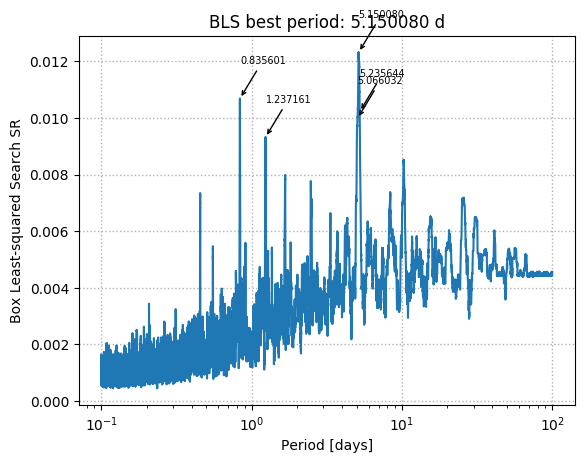

In [48]:
Image('lsp-plot.png')

In [49]:
# This looks promising, let's plot the phased LC using the best period

# first, we need to read in the light curve
lcdict = read_csv_lightcurve('csvlcs/HAT-529-0004752-hplc.csv')

# next, use times, mags and the best period from the period-finding
# result to make a phased LC plot
plotbase.plot_phased_mag_series(lcdict['rjd'],
                                lcdict['iep'],
                                pfd['iep']['2-bls']['bestperiod'],
                                phasebin=0.002)

[2018-03-16T04:48:31Z - INFO] spline fit done. nknots = 30,  chisq = 316674.13137, reduced chisq = 20.45699
[2018-03-16T04:48:32Z - INFO] using period: 5.150080 d and epoch: 57184.623230
[2018-03-16T04:48:32Z - WRN!] no output file specified and no $DISPLAY set, saving to magseries-phased-plot.png in current directory


(5.1500795397243442,
 array([ 57184.62323]),
 '/Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/magseries-phased-plot.png')

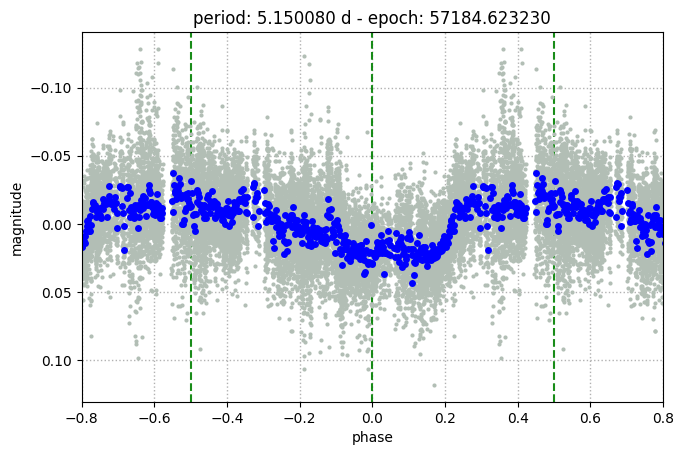

In [50]:
Image('magseries-phased-plot.png')

Not likely to be an transiting system then. But BLS finds anything that's vaguely box-shaped, so this is fine. We'll now run period-finding on a bunch of light curves.

In [52]:
target_lcs = glob.glob('csvlcs/HAT*.csv')
target_lcs = sorted(target_lcs)
print(len(target_lcs))

605


In [12]:
# We will use the lcproc.parallel_pf function to operate on a list of LCs
from astrobase.lcproc.periodsearch import parallel_pf
help(parallel_pf)

Help on function parallel_pf in module astrobase.lcproc.periodsearch:

parallel_pf(lclist, outdir, timecols=None, magcols=None, errcols=None, lcformat='hat-sql', lcformatdir=None, pfmethods=('gls', 'pdm', 'mav', 'win'), pfkwargs=({}, {}, {}, {}), sigclip=10.0, getblssnr=False, nperiodworkers=8, ncontrolworkers=1, liststartindex=None, listmaxobjects=None, minobservations=500, excludeprocessed=True)
    This drives the overall parallel period processing for a list of LCs.
    
    As a rough benchmark, 25000 HATNet light curves with up to 50000 points per
    LC take about 26 days in total for an invocation of this function using
    GLS+PDM+BLS, 10 periodworkers, and 4 controlworkers (so all 40 'cores') on a
    2 x Xeon E5-2660v3 machine.
    
    Parameters
    ----------
    
    lclist : list of str
        The list of light curve file to process.
    
    outdir : str
        The output directory where the period-finding result pickles will go.
    
    timecols : list of str or No

In [54]:
# the arguments for this can mostly be copied over from our
# earlier call to lcproc.run_pf.
pfl = parallel_pf(target_lcs,                        # operate on this LC list
                  outdir='period-finding',           # write output to this directory
                  lcformat='hplc',                   # use our custom LC format
                  pfmethods=['gls','pdm','bls'],     # a list of period-finders to run
                  pfkwargs=[{}, {}, {}, {}],         # optional keyword arguments for each PF function
                  sigclip=10.0,                      # the sigclip to apply to the LC
                  getblssnr=False,                   # let's not get the SNR to save time
                  nperiodworkers=8,                  # use 8 period workers on this laptop
                  ncontrolworkers=1)                 # use 1 control worker for managing processes

[2018-03-16T04:51:27Z - WRN!] periodfinding result for csvlcs/HAT-529-0004752-hplc.csv already exists at period-finding/periodfinding-HAT-529-0004752.pkl, skipping because excludeprocessed=True
[2018-03-16T05:19:43Z - WRN!] periodfinding result for csvlcs/HAT-577-0000044-hplc.csv already exists at period-finding/periodfinding-HAT-577-0000044.pkl, skipping because excludeprocessed=True
[2018-03-16T05:20:43Z - WRN!] periodfinding result for csvlcs/HAT-577-0000221-hplc.csv already exists at period-finding/periodfinding-HAT-577-0000221.pkl, skipping because excludeprocessed=True
[2018-03-16T05:21:45Z - WRN!] periodfinding result for csvlcs/HAT-577-0000705-hplc.csv already exists at period-finding/periodfinding-HAT-577-0000705.pkl, skipping because excludeprocessed=True
[2018-03-16T05:25:30Z - WRN!] periodfinding result for csvlcs/HAT-577-0001779-hplc.csv already exists at period-finding/periodfinding-HAT-577-0001779.pkl, skipping because excludeprocessed=True
[2018-03-16T05:25:31Z - WRN!] 

In [57]:
# Looks like we're done, it took about 4 hours on a 2015 Macbook Pro (4-core/8-thread 2.2 Ghz Intel i7)
!ls period-finding | wc -l

605


Now that we're done with period-finding, we can go ahead and start making checkplots.

## Making checkplots for a collection of light curves

Checkplots contain all the information necessary to characterize an object's variability. At a minimum, they contain all the information from the object's light curve, the object's magnitudes, colors, and GAIA information, and phased light curves generated using results from period-finding. We can add more optional information to checkplots, including: neighbor light curves to check for blending, cross-matches against external catalogs, and color-magnitude diagrams of the light curve collection. 

Below, we'll first make a checkplot for a single object and visualize it as a PNG.

In [13]:
# To make a checkplot complete with neighbor and xmatch info,
# we'll use lcproc.runcp
from astrobase.lcproc.checkplotgen import runcp
help(runcp)

Help on function runcp in module astrobase.lcproc.checkplotgen:

runcp(pfpickle, outdir, lcbasedir, lcfname=None, cprenorm=False, lclistpkl=None, nbrradiusarcsec=60.0, maxnumneighbors=5, makeneighborlcs=True, fast_mode=False, gaia_max_timeout=60.0, gaia_mirror=None, xmatchinfo=None, xmatchradiusarcsec=3.0, minobservations=99, sigclip=10.0, lcformat='hat-sql', lcformatdir=None, timecols=None, magcols=None, errcols=None, skipdone=False, done_callback=None, done_callback_args=None, done_callback_kwargs=None)
    This makes a checkplot pickle for the given period-finding result pickle
    produced by `lcproc.periodfinding.runpf`.
    
    Parameters
    ----------
    
    pfpickle : str or None
        This is the filename of the period-finding result pickle file created by
        `lcproc.periodfinding.runpf`. If this is None, the checkplot will be
        made anyway, but no phased LC information will be collected into the
        output checkplot pickle. This can be useful for just col

In [59]:
# Let's make a checkplot for HAT-577-0001797
cpf = runcp(
    'period-finding/periodfinding-HAT-577-0001797.pkl', # the period-finding result to use
    'checkplots', # output directory to write checkplot pickles to
    'csvlcs', # the directory containing the light curves
    lclistpkl='IC4725-catalog.pkl', # the object catalog pickle we made with neighbor info
    nbrradiusarcsec=60.0, # maximum distance in arcsec to look for neighbors
    xmatchinfo='xmatch-cats/IC4725-xmatch-catalogs.pkl', # xmatch pickle we made
    xmatchradiusarcsec=3.0, # maximum cross-match distance to use in arcsec
    sigclip=10.0, # sigclip to apply to LC
    lcformat='hplc' # our custom LC format
)

[2018-03-16T15:29:00Z - WRN!] one or more of the 'pmra', 'pmdecl', 'jmag' keys are missing from the input objectinfo dict, can't get proper motion features
[2018-03-16T15:29:00Z - WRN!] failed: no GAIA objects found within 3.0 of object position (277.796, -19.330), closest object is at 10.685 arcsec away
[2018-03-16T15:29:01Z - ERR!] spline fit failed, trying SavGol fit


/Users/waqasbhatti/py36-venv/lib/python3.6/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


[2018-03-16T15:29:05Z - ERR!] spline fit failed, trying SavGol fit
[2018-03-16T15:29:13Z - ERR!] no neighbors for HAT-577-0001797, not updating...
[2018-03-16T15:29:14Z - INFO] done with HAT-577-0001797 -> ['/Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0001797-iep.pkl']


In [63]:
# we can visualize a checkplot pickle by converting it to PNG
checkplot.cp2png(cpf[0])

[2018-03-16T15:33:17Z - INFO] checkplot pickle -> checkplot PNG: /Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0001797-iep.png OK


'/Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0001797-iep.png'

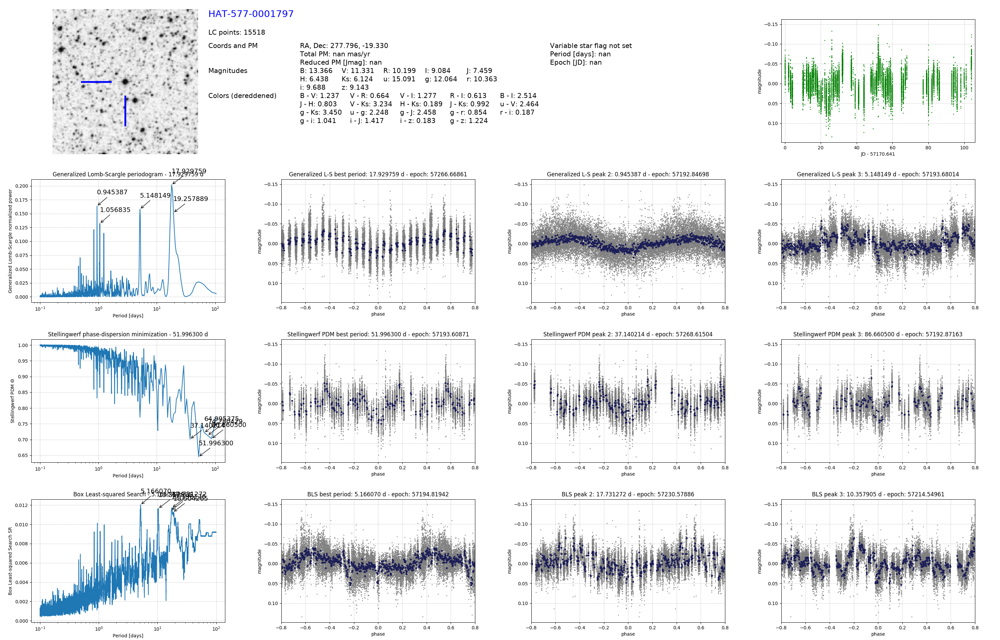

In [64]:
Image('/Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0001797-iep.png')

The canonical way of looking at checkplot pickles, especially large collections of them, is to use the checkplotserver webapp. We'll get into this later on. For now, let's make checkplots for the rest of our light curves. After that, we'll see how to add color-mag-diagram information to the checkplots in final preparation for browsing through them with the checkplotserver.

In [15]:
# We'll use lcproc.parallel_cp_pfdir and copy over our args
# from the previous call to lcproc.runcp
from astrobase.lcproc.checkplotgen import parallel_cp_pfdir
help(parallel_cp_pfdir)

Help on function parallel_cp_pfdir in module astrobase.lcproc.checkplotgen:

parallel_cp_pfdir(pfpickledir, outdir, lcbasedir, pfpickleglob='periodfinding-*.pkl*', lclistpkl=None, cprenorm=False, nbrradiusarcsec=60.0, maxnumneighbors=5, makeneighborlcs=True, fast_mode=False, gaia_max_timeout=60.0, gaia_mirror=None, xmatchinfo=None, xmatchradiusarcsec=3.0, minobservations=99, sigclip=10.0, lcformat='hat-sql', lcformatdir=None, timecols=None, magcols=None, errcols=None, skipdone=False, done_callback=None, done_callback_args=None, done_callback_kwargs=None, maxobjects=None, nworkers=32)
    This drives the parallel execution of `runcp` for a directory of
    periodfinding pickles.
    
    Parameters
    ----------
    
    pfpickledir : str
        This is the directory containing all of the period-finding pickles to
        process.
    
    outdir : str
        The directory the checkplot pickles will be written to.
    
    lcbasedir : str
        The base directory that this function

In [ ]:
cpl = parallel_cp_pfdir(
    'period-finding', # the directory where all the period-finding result pickles are
    'checkplots', # directory to where the output will go
    'csvlcs', # the directory containing the light curves
    lclistpkl='IC4725-catalog.pkl', # the object catalog pickle we made with neighbor info
    nbrradiusarcsec=60.0, # maximum distance in arcsec to look for neighbors
    xmatchinfo='xmatch-cats/IC4725-xmatch-catalogs.pkl', # xmatch pickle we made
    xmatchradiusarcsec=3.0, # maximum cross-match distance to use in arcsec
    sigclip=10.0, # sigclip to apply to LC
    lcformat='hplc', # our custom LC format
    nworkers=4 # number of parallel workers to launch
)

In [11]:
# This took about an hour on the same machine
# I ran it outside the notebook because it produces a lot of output
!ls checkplots/*.pkl | wc -l

605


## Adding color-mag-diagram information to checkplots

This is an optional step, but can be useful when looking at collections of objects where we have distance information via parallaxes or if the objects are all in a stellar cluster (like this instance).

In [16]:
# We'll use lcproc.checkplotproc.colormagdiag_cpdir, which has the same args
# as colormagdiagram_cplist, so let's look at that first
from astrobase.lcproc.checkplotproc import colormagdiagram_cplist, colormagdiagram_cpdir
help(colormagdiagram_cplist)

Help on function colormagdiagram_cplist in module astrobase.lcproc.checkplotproc:

colormagdiagram_cplist(cplist, outpkl, color_mag1=['gaiamag', 'sdssg'], color_mag2=['kmag', 'kmag'], yaxis_mag=['gaia_absmag', 'rpmj'])
    This makes color-mag diagrams for all checkplot pickles in the provided
    list.
    
    Can make an arbitrary number of CMDs given lists of x-axis colors and y-axis
    mags to use.
    
    Parameters
    ----------
    
    cplist : list of str
        This is the list of checkplot pickles to process.
    
    outpkl : str
        The filename of the output pickle that will contain the color-mag
        information for all objects in the checkplots specified in `cplist`.
    
    color_mag1 : list of str
        This a list of the keys in each checkplot's `objectinfo` dict that will
        be used as color_1 in the equation::
    
                x-axis color = color_mag1 - color_mag2
    
    color_mag2 : list of str
        This a list of the keys in each che

In [29]:
# First, we'll generate a color-mag diagram for the entire light curve collection
# This operates on a directory of checkplots
cmd = colormagdiagram_cpdir(
    'checkplots', # the directory where the checkplots are
    'IC4725-colormagdiagram.pkl', # the output pickle to generate
    # CMDs are generated using color_mag1[i] - color_mag2[i] as color and yaxis_mag[i] as mag
    # the following will generate three CMDs: 
    # (1) gaiamag-kmag / gaia_absmag, (2) sdssg-kmag / rpmj, (3) gaiamag-kmag / gaiamag
    # rpmj is the reduced proper motion and can be thought of as a proxy for absolute J mag
    color_mag1=['gaiamag','sdssg','gaiamag'], 
    color_mag2=['kmag','kmag','kmag'],
    yaxis_mag=['gaia_absmag','rpmj','gaiamag']
)

In [21]:
# cmd is a dict containing the colors and mags of the collection
# These can be plotted directly using the arrays
cmd.keys()

dict_keys(['objectids', 'mags', 'colors', 'color_mag1', 'color_mag2', 'yaxis_mag'])

In [30]:
cmd['mags']

array([[         nan,          nan,   9.76958857],
       [  1.52899762,          nan,  10.27557022],
       [         nan,          nan,   9.82191926],
       ..., 
       [         nan,          nan,          nan],
       [  4.35506667,          nan,   8.91500279],
       [ -2.98332283,          nan,  10.16701731]])

In [31]:
# Let's see how many objects have useful CMD info

print(np.isfinite(cmd['mags'][:,0]).sum()) # GAIA absolute mag
print(np.isfinite(cmd['mags'][:,1]).sum()) # reduced proper motion 
print(np.isfinite(cmd['mags'][:,2]).sum()) # GAIA mag

53
0
557


Text(0,0.5,'$G$')

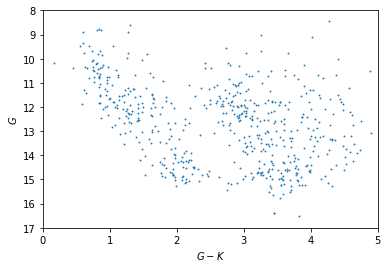

In [39]:
# let's make a gaiamag-kmag / gaiamag CMD then

import matplotlib.pyplot as plt

plt.scatter(cmd['colors'][:,2], cmd['mags'][:,2],marker='.',s=3)
plt.xlim((0,5))
plt.ylim((17,8))
plt.xlabel(r'$G - K$')
plt.ylabel(r'$G$')

In [18]:
# That looks mostly like giant stars and small main sequence

# The next step is to add the CMD to each checkplot
# this will overplot the object's position in the CMD
# so it stands out easily

# We'll use lcproc.checkplotproc.add_cmds_cpdir for this
from astrobase.lcproc.checkplotproc import add_cmds_cpdir
help(add_cmds_cpdir)

Help on function add_cmds_cpdir in module astrobase.lcproc.checkplotproc:

add_cmds_cpdir(cpdir, cmdpkl, cpfileglob='checkplot*.pkl*', require_cmd_magcolor=True, save_cmd_pngs=False)
    This adds CMDs for each object in cpdir.
    
    Parameters
    ----------
    
    cpdir : list of str
        This is the directory to search for checkplot pickles.
    
    cmdpkl : str
        This is the filename of the CMD pickle created previously.
    
    cpfileglob : str
        The UNIX fileglob to use when searching for checkplot pickles to operate
        on.
    
    require_cmd_magcolor : bool
        If this is True, a CMD plot will not be made if the color and mag keys
        required by the CMD are not present or are nan in each checkplot's
        objectinfo dict.
    
    save_cmd_pngs : bool
        If this is True, then will save the CMD plots that were generated and
        added back to the checkplotdict as PNGs to the same directory as
        `cpx`.
    
    Returns
    ----

In [ ]:
x = add_cmds_cpdir(
    'checkplots', # the directory for the checkplots
    'IC4725-colormagdiagram.pkl', # the CMD pickle we made above
    save_cmd_pngs=True # let's save the CMD for each object as a PNG as well
)

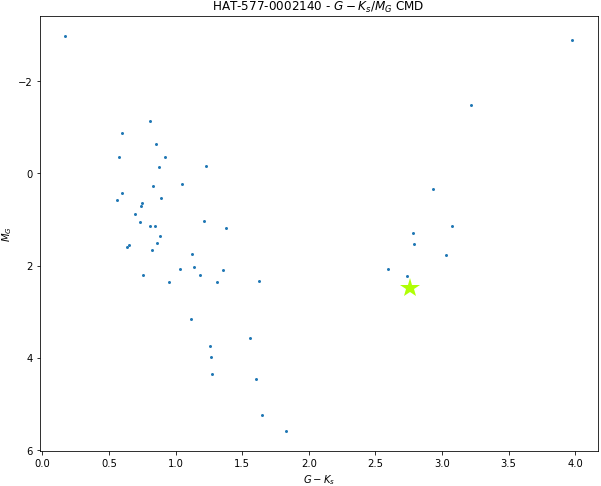

In [41]:
# Let's see what these CMDs look like

# first, let's look at a GAIA G - 2MASS K vs. GAIA absolute G CMD
Image('checkplots/cmd-HAT-577-0002140-gaiamag-kmag.gaia_absmag.png')

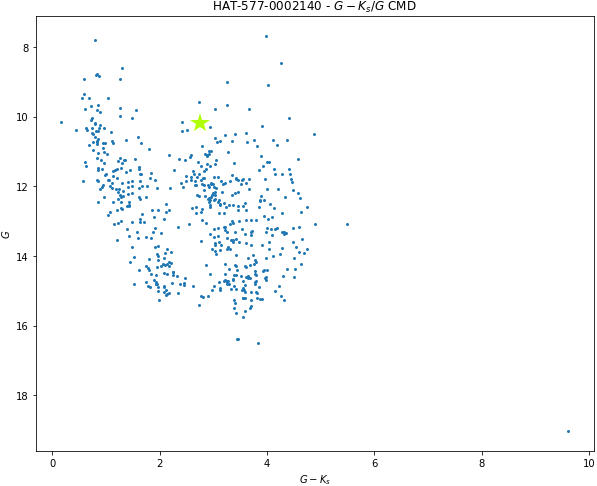

In [42]:
# this looks like a giant star...
# then for the same object, let's look at a GAIA G - 2MASS K vs. GAIA G CMD
Image('checkplots/cmd-HAT-577-0002140-gaiamag-kmag.gaiamag.png')

At this point, we're done with preparing our checkplots for review. Next, we'll fire up the checkplotserver to do so.

## Preparing a checkplot list for review

Before we can start, we need to generate a checkplot list JSON that the checkplotserver needs to be able to find checkplots. This is done by using the `checkplotlist` script that comes with astrobase. This should be on your path, so you should be able to invoke it as below. 

In [43]:
!ls

IC4725-catalog.pkl		       magseries-phased-plot.png
IC4725-colormagdiagram.pkl	       notebook.tex
IC4725-hatpi-observations-catalog.txt  output_53_0.png
checkplots			       output_55_0.png
csvlcs				       period-finding
lc-collection-work.ipynb	       pklcs
lsp-plot.png			       xmatch-cats


In [48]:
# This invocation will generate a checkplot list JSON and sort the checkplots
# so that objects with smallest variability index eta (i.e. very probable variables)
# are near the top of the list. It will also filter out anything that doesn't have 
# neighboring stars (a contrived example to show how neighboring stars show up in the 
# checkplotserver interface). 

# Filtering and sorting the checkplots like this can help keep the number
# of objects that need to be manually reviewed small enough to manage. Use 
# checkplotlist --help to see other examples and details on sorting/filtering checkplots

!checkplotlist pkl checkplots --sortby 'varinfo.eta_normal|asc' --filterby 'objectinfo.neighbors|gt@0'

searching for checkplots: checkplots/*checkplot*.pkl
found 605 checkplot files in dir: checkplots
sorting checkplot pickles by varinfo.eta_normal in order: asc
filtering checkplot pickles by ['objectinfo.neighbors'] using: ['gt@0']
retrieving checkplot info using 8 workers...
filters applied: ['objectinfo.neighbors|gt@0'] -> objects found: 6 
checkplot file list written to /Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/objectinfo.neighbors_gt_0-varinfo.eta_normal_asc-checkplot-filelist.json


Looks like there are only 6 objects in this LC collection with neighbors (< 60 arcsec proximity)

## Running checkplotserver

In [49]:
# Now we can go ahead and start the checkplotserver
!checkplotserver --checkplotlist=objectinfo.neighbors_gt_0-varinfo.eta_normal_asc-checkplot-filelist.json

[I 180316 14:09:34 checkplotserver:152] using provided checkplot list file: objectinfo.neighbors_gt_0-varinfo.eta_normal_asc-checkplot-filelist.json
[I 180316 14:09:34 checkplotserver:304] started checkplotserver. listening on http://127.0.0.1:5225
[I 180316 14:09:38 web:2063] 200 GET / (127.0.0.1) 14.16ms
[I 180316 14:09:38 web:2063] 200 GET /list (127.0.0.1) 0.43ms
[I 180316 14:09:38 checkplotserver_handlers:502] loading /Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0113042-iep.pkl...
[I 180316 14:09:38 checkplotserver_handlers:524] loaded /Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster-lcs/checkplots/checkplot-HAT-577-0113042-iep.pkl
[I 180316 14:09:38 web:2063] 200 GET /cp/Y2hlY2twbG90cy9jaGVja3Bsb3QtSEFULTU3Ny0wMTEzMDQyLWllcC5wa2w= (127.0.0.1) 184.04ms
[I 180316 14:10:06 checkplotserver_handlers:924] loading /Users/waqasbhatti/astrowork/frames-and-lcs/hatpi-G577-projid12-IC4725-cluster

[I 180316 14:15:34 checkplotserver_handlers:1428] forcereload = True
[I 180316 14:15:34 checkplotserver_handlers:1496] psearch-mav
[I 180316 14:15:34 checkplotserver_handlers:1497] [array([ 57170.64095,  57170.64139,  57170.64194, ...,  57274.63173,
            57274.63222,  57274.63355]), array([-0.019855, -0.028955, -0.029025, ..., -0.0078  , -0.0401  ,  0.01488 ]), array([ 0.0067 ,  0.0064 ,  0.00661, ...,  0.00619,  0.00625,  0.0063 ])]
[I 180316 14:15:34 checkplotserver_handlers:1498] {'startp': None, 'endp': None, 'magsarefluxes': False, 'autofreq': True, 'stepsize': 0.0001, 'nbestpeaks': 10, 'sigclip': None, 'lctimefilters': '', 'lcmagfilters': '', 'periodepsilon': 0.1, 'nharmonics': 6}
[I 180316 14:15:34 smav:39] using autofreq with 5195 frequency points, start P = 0.100, end P = 103.993
[I 180316 14:15:34 smav:39] using 8 workers...
/Users/waqasbhatti/py36-venv/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the im

Now let's look at some of the UI elements of the checkplotserver.

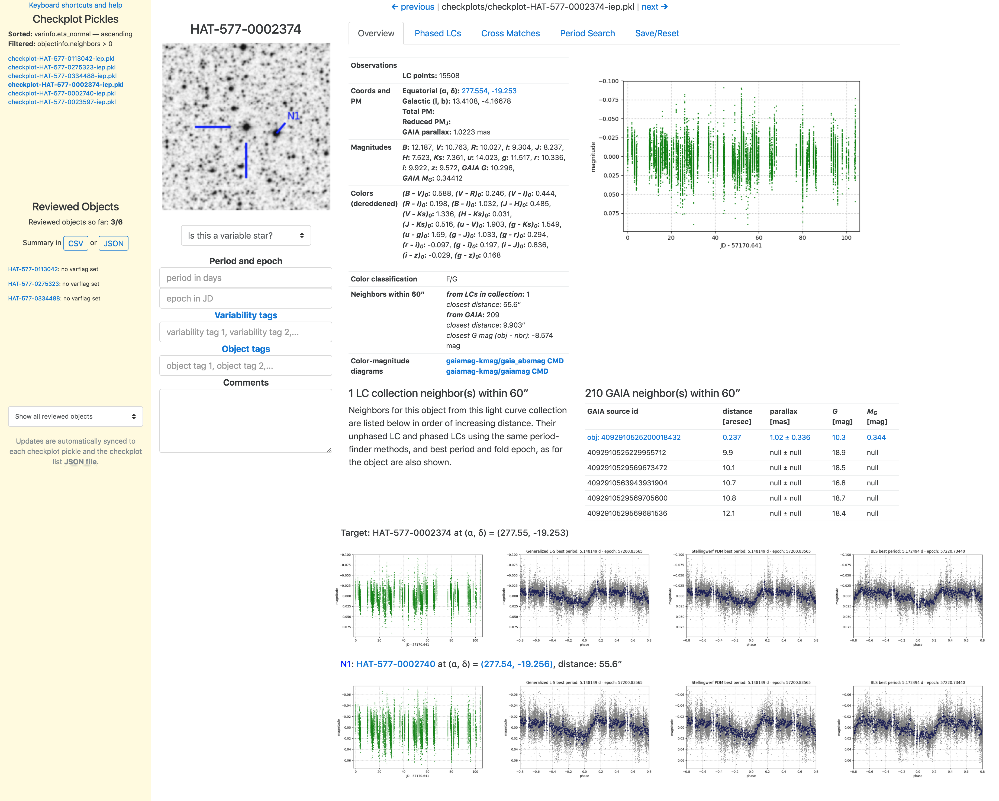

In [50]:
Image('/Users/waqasbhatti/Downloads/screencapture-127-0-0-1-5225-2018-03-16-14_13_36.png')

We can see that all of our prep work has made it safely to the checkplotserver for use in reviewing objects:

First, the "Object Overview" tab:

- **far top-left:** a list of checkplot pickles in order of and filtered by the requested `checkplotlist` arguments. Clicking on any of these will load that checkplot pickle.
- **far bottom-left:** a list showing which objects have been reviewed, their variability tag status, and their object and variability tags if any have been set. This list is the same as the checkplot list JSON we created using `checkplotlist`. It is updated and saved every time a new checkplot is loaded, so you can come back to checkplotserver (even if you stop the process for whatever reason) after some time and resume where you left off by clicking on the last reviewed object. The current reviewed objects list can be exported to either CSV or JSON by clicking on the appropriate buttons. The filter select box at the bottom can be used to toggle between objects that have been marked as probable variables, maybe variables, not variables, or all objects in the collection to browse these subsets in isolation.
- **top-left:** the Digitized Sky Survey finder chart of the object and its environment. This is about 5 arcminutes wide. Neighbors of this object in this light curve collection are highlighted on the finder.
- **bottom-left:** a set of controls used to set the variability flag for this object ("object is variable", "not sure if object is variable", "object is not variable"), the variability tag ("detached EB", "RRab", etc.), the object tag ("giant star", "blended with neighbors", "F/G star", etc.), the period and epoch of the object, and any comments about the object.
- **middle-top:**: an object information table, containing details of the object's observations, coordinates and proper motion, magnitudes, colors and color classification, neighbors, and links to generated CMDs if any exist.
- **middle-right:** the unphased light curve of the object 
- **middle-bottom and -right:** panels with the object's unphased and phased LCs using all the available period-finder methods, similar panels for each of the object's LC collection neighbors, and finally, details on the object's GAIA neighbors. If the LC collection neighbors are in present in the same checkplotlist JSON as the object, you can jump directly to their respective checkplots using the link in the object's ID display. For GAIA neighbors, a table is provided showing the object and all neighbors found in GAIA; mousing over each row of this table will bring up a highlight box on the finder chart in the top-left for that object, thus making it easy to browse through all neighbors.

If the object's CMDs are available, you can click on the links in the object information table, to bring up something like the screenshot below.

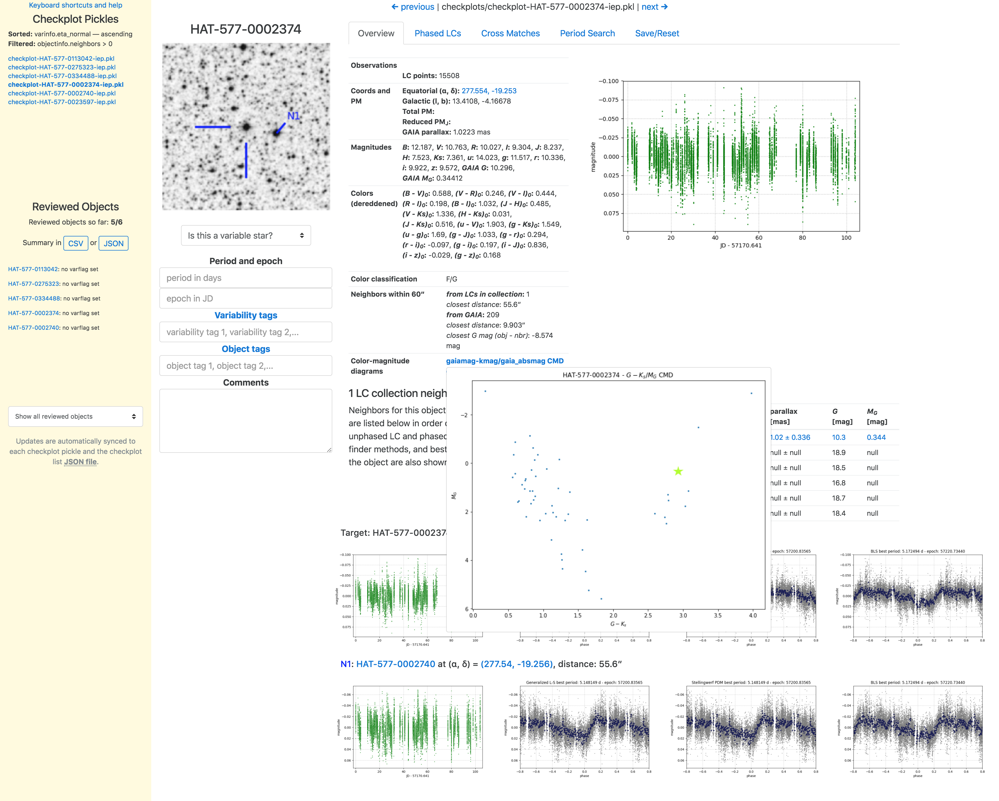

In [51]:
Image('/Users/waqasbhatti/Downloads/screencapture-127-0-0-1-5225-2018-03-16-14_17_02.png')

Here, you can see the object itself depicted as a gold star in the CMD.

Moving on, the "Phased LCs" tab (see screenshot below) shows all the phased light curves using the three best periods obtained by all the period-finder methods we applied. Clicking on any one of these tiles will set the Period and Epoch textboxes to reflect the period and epoch used for that plot.

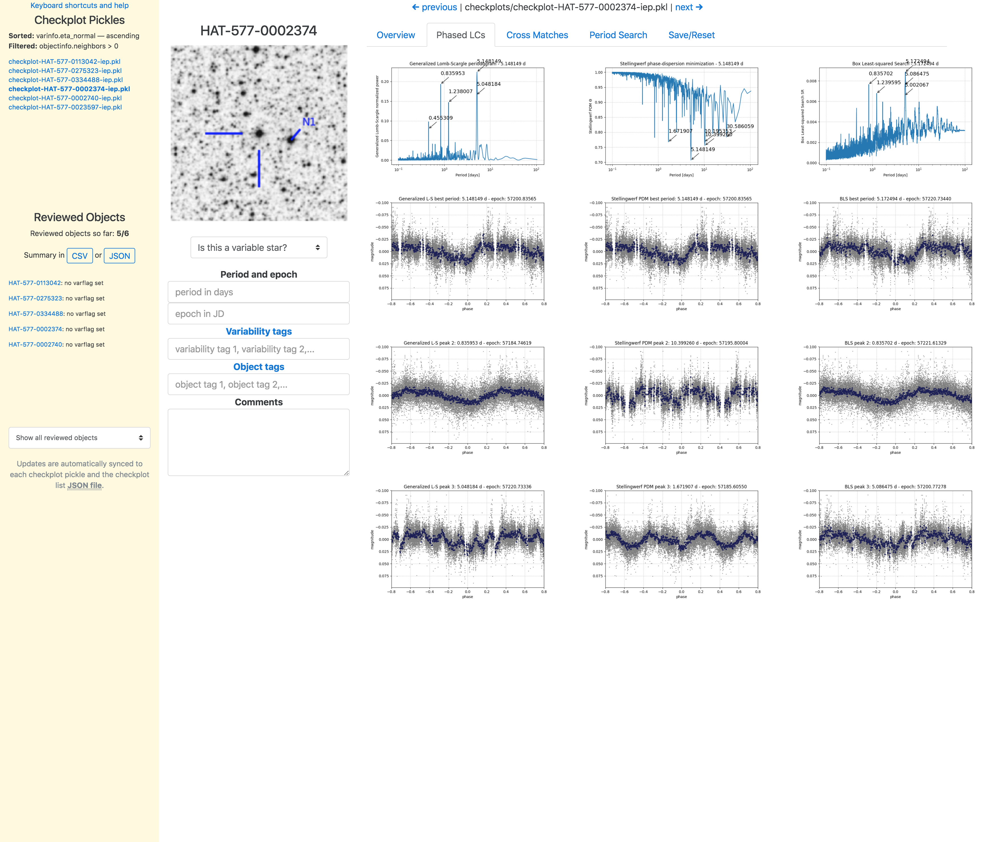

In [52]:
Image('/Users/waqasbhatti/Downloads/screencapture-127-0-0-1-5225-2018-03-16-14_14_48.png')

The "Cross Matches" tab shows the result of the cross-matching to external catalogs we did earlier. Each external catalog will be listed along with the columns we extracted from it.

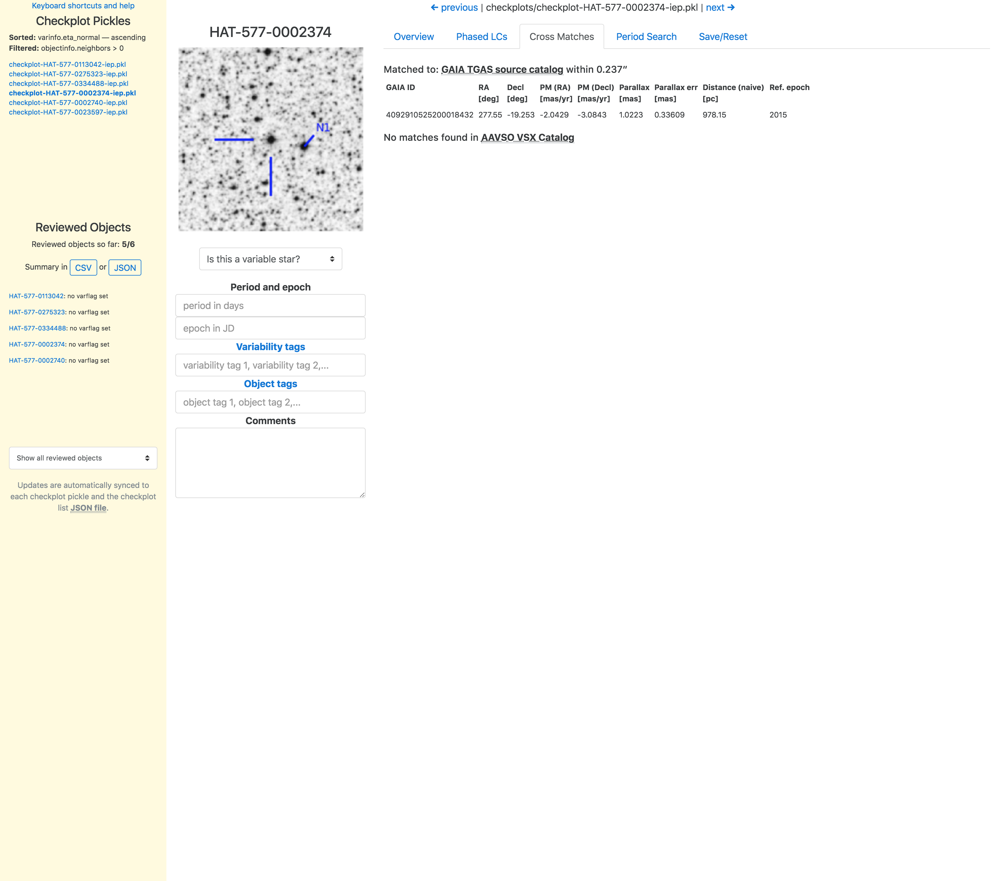

In [54]:
Image('/Users/waqasbhatti/Downloads/screencapture-127-0-0-1-5225-2018-03-16-14_15_10.png')

Finally, the "Period Search" tab can be used to rerun a period-search on the object. Going through the interface elements:

- **top-left:** this is the unphased light curve of the object, replotted here to help with LC filtering.
- **middle-left:** these are the LC filtering controls for use as input to the period-finder and phased LC plotting controls. You can apply time filters, flux/mag filters, or sigma-clipping to remove uninteresting parts or outlying points in the light curve. The filters here are saved to the checkplot itself, but the actual time-series is left untouched, so you can tweak and re-apply the filters to the pristine version later on. 
- **middle-right:** these are the periodogram controls. You can choose which periodogram to run, then set various parameters associated with it. Clicking on the button will launch the period-finder processes in the background.
- **bottom:** once a period-finder finishes, it will produce a periodogram plot that will show up in the left panel here with peaks identified. The highest power peak will automatically produce a phased light curve that takes into account the filters and sigma-clipping selected above. This will show up in the right panel. The controls above the panels can be used to select which periodogram peak to use to make the phased LC plot. The controls below the panels control the phased LC plot itself and allow updating the "Period and Epoch" textbox directly from the plot.

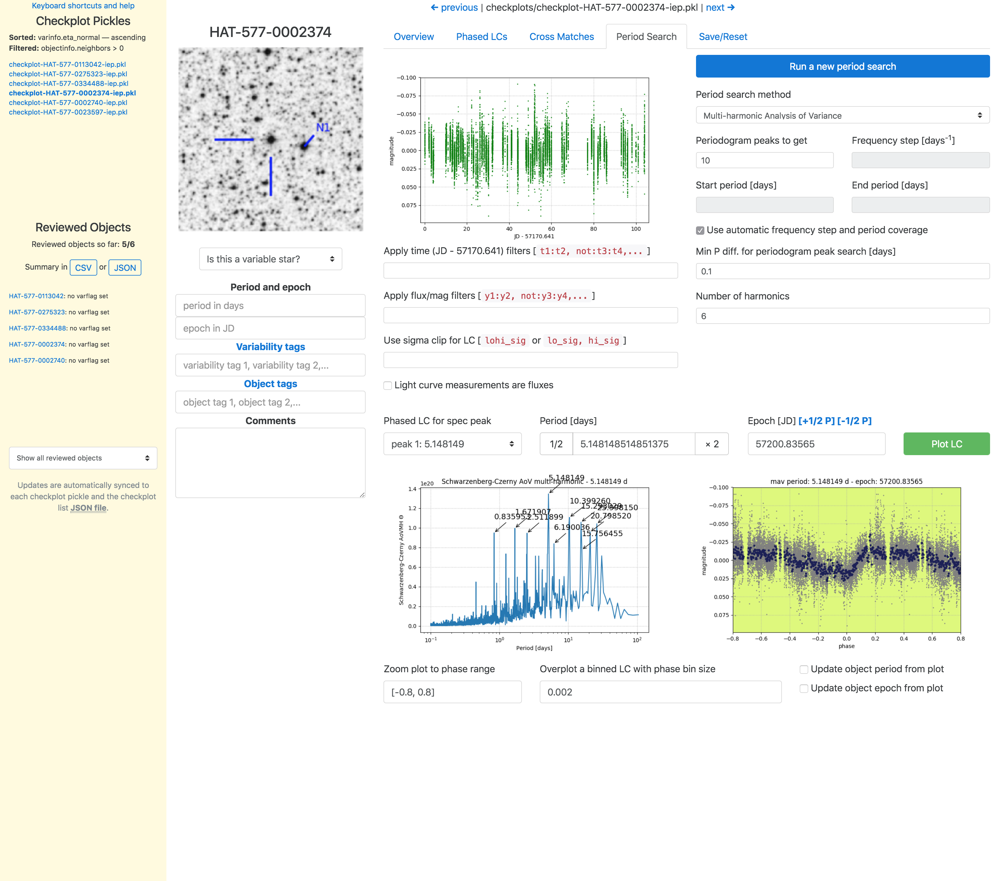

In [55]:
Image('/Users/waqasbhatti/Downloads/screencapture-127-0-0-1-5225-2018-03-16-14_15_57.png')